<a href="https://colab.research.google.com/github/freddy-7/TI3002C/blob/main/5_Extracci%C3%B3n_de_Caracter%C3%ADsticas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
#Importamos las librerias pandas, numpy y matplotlib respectivamente
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [41]:
#Carga desde un archivo .xlsx sin indice
Micro_Retailer= pd.read_csv('DatosLA_sin_nulos_ni_atipicos.csv') 

In [42]:
#Verificamos información del DataFrame
Micro_Retailer.info()

<class 'pandas.DataFrame'>
RangeIndex: 43751 entries, 0 to 43750
Data columns (total 49 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Unnamed: 0                    43751 non-null  int64  
 1   id                            43751 non-null  int64  
 2   listing_url                   43751 non-null  str    
 3   scrape_id                     43751 non-null  int64  
 4   last_scraped                  43751 non-null  int64  
 5   source                        43751 non-null  str    
 6   name                          43751 non-null  str    
 7   description                   43751 non-null  str    
 8   picture_url                   43751 non-null  str    
 9   host_id                       43751 non-null  int64  
 10  host_url                      43751 non-null  str    
 11  host_profile_url              43751 non-null  str    
 12  host_name                     43751 non-null  str    
 13  host_locatio

In [43]:
#Imprimo los primeros 5 registro del dataframe
Micro_Retailer.head()

,Unnamed: 0,id,listing_url,scrape_id,last_scraped,source,name,description,picture_url,host_id,...,price_quote_checkout_date,price_quote_total_price,price_quote_price_per_night,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm
0,0,2708,https://www.airbnb.com/rooms/2708,20260615054117,46188,city scrape,"Run Runyon, Beaut Furn Mirror Mini-Suit w/ Fir...",Run Runyon Canyon<br /><br />Gym & Sauna <br /...,https://a0.muscache.com/pictures/hosting/Hosti...,3008,...,46275.0,2016.74,67.22,30.0,1125.0,30.0,30.0,1125.0,1125.0,30.0
1,1,2732,https://www.airbnb.com/rooms/2732,20260615054117,46189,city scrape,Zen Life at the Beach,An oasis of tranquility awaits you.,https://a0.muscache.com/pictures/1082993/c5a99...,3041,...,46211.0,1494.94,213.56,1.0,27.0,1.0,7.0,27.0,27.0,7.0
2,2,6033,https://www.airbnb.com/rooms/6033,20260615054117,46195,previous scrape,Poolside Serenity Studio,Our distinctive bachelor's studio for 1-3 gues...,https://a0.muscache.com/pictures/458111/986c76...,11619,...,46225.0,2989.00,99.63,30.0,1125.0,30.0,30.0,1125.0,1125.0,30.0
3,3,6931,https://www.airbnb.com/rooms/6931,20260615054117,46188,city scrape,"RUN Runyon, Beau Furn Rms Terrace Hollyw Hill ...",Run Runyon Canyon & Views<br /><br />Gym & Sau...,https://a0.muscache.com/pictures/miso/Hosting-...,3008,...,46234.0,2856.18,95.21,30.0,1125.0,30.0,30.0,1125.0,1125.0,30.0
4,4,7874,https://www.airbnb.com/rooms/7874,20260615054117,46189,city scrape,HD Wi-Fi E Bellflower Cerritos Lakewood LB LA,"Great luxury home has 2nd floor sunny, non-smo...",https://a0.muscache.com/pictures/hosting/Hosti...,21700,...,46190.0,113.00,113.00,1.0,730.0,1.0,1.0,730.0,730.0,1.0


In [129]:
#Obtengo un análisis univariado de las variables categóricas
Tabla_freq = Micro_Retailer['amenities'].value_counts().reset_index()
Tabla_freq

,amenities,count
0,"[""Freezer"", ""TV"", ""Stove"", ""Kitchen"", ""Air con...",41
1,"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alar...",30
2,"[""Stove"", ""Air conditioning"", ""Lock on bedroom...",29
3,"[""TV"", ""Stove"", ""Air conditioning"", ""Smoke ala...",29
4,"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alar...",26
5,"[""TV"", ""Air conditioning"", ""Books and reading ...",26
6,[],24
7,"[""Coffee maker"", ""TV"", ""Stove"", ""Air condition...",23
8,"[""TV"", ""First aid kit"", ""Kitchen"", ""Fire extin...",23
9,"[""Coffee maker"", ""49 inch HDTV with premium ca...",22


In [132]:
#Obtengo un filtro de los valores más relevantes de la variable categórica seleccionada
Filtro= Tabla_freq[Tabla_freq['count']>20]
Filtro

,amenities,count
0,"[""Freezer"", ""TV"", ""Stove"", ""Kitchen"", ""Air con...",41
1,"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alar...",30
2,"[""Stove"", ""Air conditioning"", ""Lock on bedroom...",29
3,"[""TV"", ""Stove"", ""Air conditioning"", ""Smoke ala...",29
4,"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alar...",26
5,"[""TV"", ""Air conditioning"", ""Books and reading ...",26
6,[],24
7,"[""Coffee maker"", ""TV"", ""Stove"", ""Air condition...",23
8,"[""TV"", ""First aid kit"", ""Kitchen"", ""Fire extin...",23
9,"[""Coffee maker"", ""49 inch HDTV with premium ca...",22


In [133]:
#Ajusto el indice de mi dataframe
Filtro_index= Filtro.set_index('amenities')
Filtro_index

,count
amenities,
"[""Freezer"", ""TV"", ""Stove"", ""Kitchen"", ""Air conditioning"", ""Heating"", ""Refrigerator"", ""Dedicated workspace"", ""Free street parking"", ""Dishwasher"", ""Smoke alarm"", ""Hot water"", ""Exterior security cameras on property"", ""Carbon monoxide alarm"", ""Wifi"", ""Washer"", ""Dryer"", ""Oven""]",41
"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alarm"", ""Gym"", ""Wifi"", ""Hangers"", ""First aid kit"", ""Bed linens"", ""Extra pillows and blankets"", ""Pets allowed"", ""Carbon monoxide alarm"", ""Paid parking on premises"", ""Essentials"", ""Shampoo"", ""Fire extinguisher"", ""Heating"", ""Dedicated workspace"", ""Self check-in"", ""Hair dryer"", ""Waterfront"", ""Beach access \u2013 Beachfront"", ""Building staff""]",30
"[""Stove"", ""Air conditioning"", ""Lock on bedroom door"", ""Smoke alarm"", ""Wifi"", ""Microwave"", ""Kitchen"", ""Bed linens"", ""Dining table"", ""Dishes and silverware"", ""Dishwasher"", ""Hot water"", ""Carbon monoxide alarm"", ""Keypad"", ""Washer"", ""Fire extinguisher"", ""Heating"", ""Refrigerator"", ""Dedicated workspace"", ""Self check-in"", ""Oven"", ""Clothing storage"", ""Cooking basics"", ""Dryer""]",29
"[""TV"", ""Stove"", ""Air conditioning"", ""Smoke alarm"", ""Wifi"", ""Microwave"", ""Kitchen"", ""Dishwasher"", ""Hot water"", ""Room-darkening shades"", ""Carbon monoxide alarm"", ""Keypad"", ""Washer"", ""Heating"", ""Refrigerator"", ""Dedicated workspace"", ""Free street parking"", ""Self check-in"", ""Oven"", ""Clothing storage"", ""Exterior security cameras on property"", ""Dryer""]",29
"[""TV"", ""Air conditioning"", ""Iron"", ""Smoke alarm"", ""Wifi"", ""Hangers"", ""First aid kit"", ""Bed linens"", ""Extra pillows and blankets"", ""Pets allowed"", ""Carbon monoxide alarm"", ""Paid parking on premises"", ""Essentials"", ""Shampoo"", ""Fire extinguisher"", ""Heating"", ""Dedicated workspace"", ""Self check-in"", ""Hair dryer"", ""Pool"", ""Building staff""]",26
"[""TV"", ""Air conditioning"", ""Books and reading material"", ""Iron"", ""Cleaning products"", ""Smoke alarm"", ""Wifi"", ""Microwave"", ""Hangers"", ""First aid kit"", ""Drying rack for clothing"", ""Bed linens"", ""Kitchen"", ""Dining table"", ""Dishes and silverware"", ""Dishwasher"", ""Hot water"", ""Extra pillows and blankets"", ""Room-darkening shades"", ""Carbon monoxide alarm"", ""Pets allowed"", ""Keypad"", ""Paid parking on premises"", ""Washer"", ""Essentials"", ""Shampoo"", ""Hot water kettle"", ""Free parking on premises"", ""Bathtub"", ""Fire extinguisher"", ""Heating"", ""Refrigerator"", ""Body soap"", ""Dedicated workspace"", ""Self check-in"", ""Oven"", ""Hair dryer"", ""Shower gel"", ""Clothing storage"", ""Conditioner"", ""Cooking basics"", ""Dryer""]",26
[],24
"[""Coffee maker"", ""TV"", ""Stove"", ""Air conditioning"", ""Lock on bedroom door"", ""Cleaning products"", ""Smoke alarm"", ""Wifi"", ""Microwave"", ""Hangers"", ""Drying rack for clothing"", ""Bed linens"", ""Kitchen"", ""Dining table"", ""Dishes and silverware"", ""Dishwasher"", ""Hot water"", ""Paid dryer \u2013 In building"", ""Carbon monoxide alarm"", ""Pets allowed"", ""Keypad"", ""Paid parking on premises"", ""Hot water kettle"", ""Freezer"", ""Fire extinguisher"", ""Heating"", ""Refrigerator"", ""Dedicated workspace"", ""Coffee"", ""Free street parking"", ""Paid washer \u2013 In building"", ""Self check-in"", ""Oven"", ""Toaster"", ""Clothing storage"", ""Long term stays allowed"", ""Exterior security cameras on property"", ""Cooking basics"", ""Cleaning available during stay""]",23
"[""TV"", ""First aid kit"", ""Kitchen"", ""Fire extinguisher"", ""Air conditioning"", ""Lock on bedroom door"", ""Heating"", ""Dedicated workspace"", ""Smoke alarm"", ""Hot water"", ""Exterior security cameras on property"", ""Carbon monoxide alarm"", ""Cooking basics"", ""Pets allowed"", ""Wifi"", ""Self check-in"", ""Smart lock"", ""Washer""]",23


Text(0, 0.5, 'Cantidad')

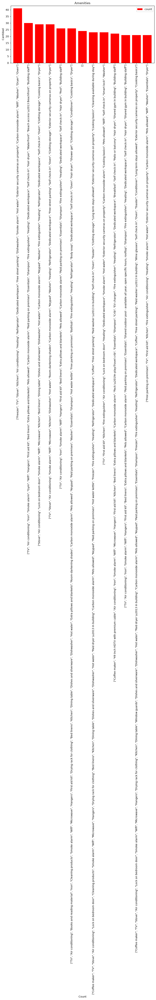

In [135]:
#Realizamos grafico de barras del dataframe filtrado
Filtro_index.plot(kind = 'bar', width=0.8, figsize=(10,4), color= "red")
plt.title('Amenities')
plt.xlabel('Count')
plt.ylabel('Cantidad')

<Axes: xlabel='214_customer_relationship_tools'>

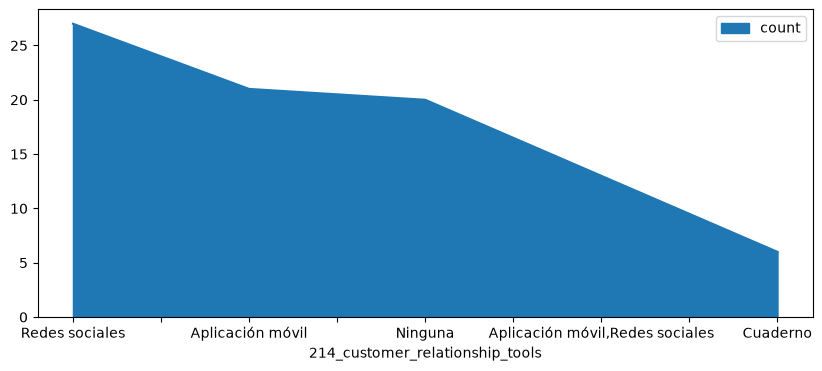

In [ ]:
#Realizamos grafico de área del dataframe filtrado
Filtro_index.plot(kind='area', figsize=(10,4),alpha = 1, )

<Axes: >

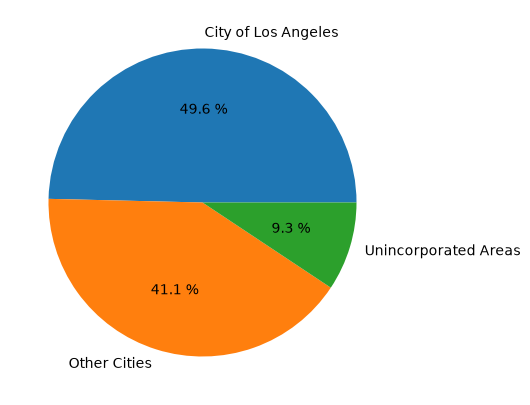

In [112]:
#Realizamos grafico de pastel del dataframe filtrado
Filtro_index["count"].plot(kind='pie', figsize=(10,5), shadow=False, autopct="%0.1f %%")

**Determinación de Clases para datos agrupados**


In [26]:
# Ajustar maximo de filas
pd.options.display.max_rows = None

In [27]:
#Corroboramos valores nulos
valores_nulos=Micro_Retailer.isnull().sum()
valores_nulos

_record_id                                                      0
_title                                                          0
_server_updated_at                                              0
_updated_by                                                     0
_geometry                                                       0
_latitude                                                       0
_longitude                                                      0
228_store_name                                                  0
229_store_picture                                               0
232_type_of_store                                               0
108_does_the_micro_retailer_has_a_barred_window_                0
99_does_the_micro_retailer_exhibits_products_outside_           0
102_does_the_micro_retailer_sells_fresh_products_               0
97_number_of_customers_in_store                                 0
268_number_fridges                                              3
184_store_

In [28]:
#Calculamos el numero total de la población "n"
Micro_Retailer['_latitude']. info()
n=171

<class 'pandas.Series'>
RangeIndex: 171 entries, 0 to 170
Series name: _latitude
Non-Null Count  Dtype  
--------------  -----  
171 non-null    float64
dtypes: float64(1)
memory usage: 1.5 KB


In [29]:
#Obtenemos el limite superior y el límite inferior de la columna objetivo
Max=Micro_Retailer['_latitude'].max()
Min=Micro_Retailer['_latitude'].min()
Limites= [Min, Max]
Limites

[np.float64(18.9993095), np.float64(19.0752733)]

In [30]:
#Calculamos el rango R
R=Max-Min
R

np.float64(0.07596380000000025)

In [31]:
#Calculamos el número de Intervalos de Clase "ni", aplicando la regla de Sturges
ni= 1+3.32*np.log10(n)
ni

np.float64(8.41354708650195)

In [33]:
#Calculamos el Ancho del Intervalo "i"
i=R/ni
i

np.float64(0.009028748424296662)

**Creación de Categorias a partir de clases**

In [34]:
#Categorización de variables
#Declaramos 8 intervalos 
#Ajustamos los limites para que todos los valores sean incluidos en los intervalos
#Ampliamos los límites en una unidad sobre los decimales menos significativos
#con la intención de incluir los valores que caigan justo en los límites
#np.float64(18.9993095), np.float64(19.0752733)
intervalos=np.linspace(18.98, 19.076, 9)
intervalos

array([18.98 , 18.992, 19.004, 19.016, 19.028, 19.04 , 19.052, 19.064,
       19.076])

In [35]:
#Creamos las categorías 
categorias= ["Categoría1(18.981°-18.992°)", "Categoría2(18.992°-19.004°)","Categoría3(19.004°-19.016°)", "Categoría4(19.016°-19.028°)",
             "Categoría5(19.028°-19.04°)", "Categoría6(19.04°-19.052°)","Categoría7(19.052°-19.064°)", "Categoría8(19.064°-19.076°)"]

In [36]:
#Finalmente creamos las categorías en la columna numérica
Micro_Retailer['_latitude']=pd.cut(x= Micro_Retailer['_latitude'], bins=intervalos, labels= categorias)
Micro_Retailer['_latitude']

0      Categoría7(19.052°-19.064°)
1      Categoría7(19.052°-19.064°)
2      Categoría7(19.052°-19.064°)
3      Categoría7(19.052°-19.064°)
4      Categoría7(19.052°-19.064°)
5      Categoría7(19.052°-19.064°)
6      Categoría7(19.052°-19.064°)
7      Categoría7(19.052°-19.064°)
8      Categoría7(19.052°-19.064°)
9      Categoría7(19.052°-19.064°)
10     Categoría4(19.016°-19.028°)
11     Categoría4(19.016°-19.028°)
12     Categoría4(19.016°-19.028°)
13     Categoría4(19.016°-19.028°)
14     Categoría4(19.016°-19.028°)
15     Categoría4(19.016°-19.028°)
16     Categoría4(19.016°-19.028°)
17     Categoría4(19.016°-19.028°)
18     Categoría4(19.016°-19.028°)
19     Categoría4(19.016°-19.028°)
20      Categoría6(19.04°-19.052°)
21     Categoría8(19.064°-19.076°)
22     Categoría8(19.064°-19.076°)
23     Categoría7(19.052°-19.064°)
24     Categoría7(19.052°-19.064°)
25     Categoría7(19.052°-19.064°)
26     Categoría7(19.052°-19.064°)
27     Categoría7(19.052°-19.064°)
28     Categoría7(19

In [37]:
#Obtengo un análisis univariado de las variables categóricas
Tabla_freq = Micro_Retailer['_latitude'].value_counts().reset_index()
Tabla_freq

,_latitude,count
0,Categoría8(19.064°-19.076°),47
1,Categoría4(19.016°-19.028°),45
2,Categoría6(19.04°-19.052°),31
3,Categoría7(19.052°-19.064°),29
4,Categoría5(19.028°-19.04°),10
5,Categoría3(19.004°-19.016°),7
6,Categoría2(18.992°-19.004°),2
7,Categoría1(18.981°-18.992°),0


In [38]:
#Obtengo un filtro de los valores más reelevantes de la variable categórica seleccionada
Filtro= Tabla_freq[Tabla_freq['count']>0]
Filtro

,_latitude,count
0,Categoría8(19.064°-19.076°),47
1,Categoría4(19.016°-19.028°),45
2,Categoría6(19.04°-19.052°),31
3,Categoría7(19.052°-19.064°),29
4,Categoría5(19.028°-19.04°),10
5,Categoría3(19.004°-19.016°),7
6,Categoría2(18.992°-19.004°),2


In [39]:
#Ajusto el indice de mi dataframe
Filtro_index= Filtro.set_index('_latitude')
Filtro_index

,count
_latitude,
Categoría8(19.064°-19.076°),47
Categoría4(19.016°-19.028°),45
Categoría6(19.04°-19.052°),31
Categoría7(19.052°-19.064°),29
Categoría5(19.028°-19.04°),10
Categoría3(19.004°-19.016°),7
Categoría2(18.992°-19.004°),2


Text(0, 0.5, 'Frecuencia')

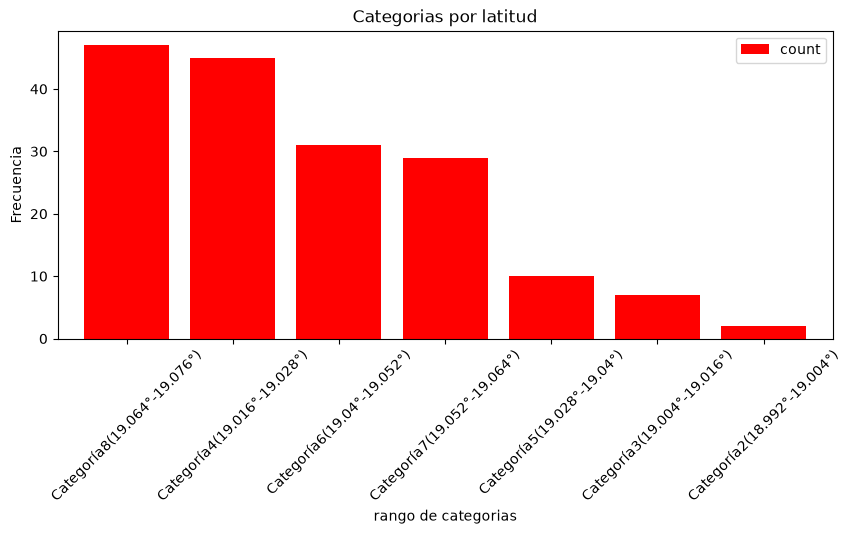

In [40]:
#Realizamos grafico de barras del dataframe filtrado
Filtro_index.plot(kind = 'bar', width=0.8, figsize=(10,4), color= "red", rot=45)
plt.title('Categorias por latitud')
plt.xlabel('rango de categorias')
plt.ylabel('Frecuencia')